# Single-cell transcriptional profiling of human thymic stroma uncovers novel cellular heterogeneity in the thymic medulla

### BIOS 470 (15 Dec. 2023)
### Isha Khapre

#### Bautista, J.L., Cramer, N.T., Miller, C.N. et al. Single-cell transcriptional profiling of human thymic stroma uncovers novel cellular heterogeneity in the thymic medulla. Nat Commun 12, 1096 (2021). https://doi.org/10.1038/s41467-021-21346-6

#### Accession Number: GSE147520 
#### https://www.ncbi.nlm.nih.gov/geo/query/acc.cgi?acc=GSE147520

#### Github:
#### https://github.com/ishakhapre/BIOS470Final

## Introduction


The human thymus, a vital organ in the immune system, plays a pivotal role in the generation and maturation of immune cells, specifically small lymphocytes tasked with safeguarding the body against foreign antigens. Recent investigations have uncovered a greater functional diversity within the thymic stroma than previously acknowledged, yet the full extent of this cellular heterogeneity in the human thymus remains a subject of incomplete understanding. This research endeavors to bridge this knowledge gap by employing state-of-the-art single-cell RNA sequencing (scRNA-seq) to comprehensively profile the human thymic stroma across various life stages.

Central to the thymic stromal landscape are thymic epithelial cells (TECs), and unraveling their development and diversity is indispensable for a comprehensive comprehension of immune system function. The primary challenge addressed by this paper is the insufficient clarity surrounding the developmental origins of TECs in humans and the mechanisms governing their maintenance. Despite the well-established functions of TECs, uncertainties persist regarding their developmental origins and regulatory processes, particularly in postnatal human tissues. The research aims to rectify this knowledge gap by leveraging scRNA-seq to scrutinize cellular heterogeneity within the human thymic microenvironment at distinct developmental time ponalysis

The data driving this study is derived from the potent technique of single-cell RNA sequencing, allowing for an in-depth analysis of gene expression profiles at the individual cell level. Applied to the human thymus across various developmental stages, this approach enables the identification of candidate pathways influencing TEC fate commitment, revelation of previously undisclosed TEC markers, and validation of distinct subsets of medullary TECs, including those expressing AIRE, corneocyte-like cells, CCL21-expressing cells, and tuft cells. Furthermore, the research pioneers the transcriptomic characterization of infrequent populations such as thymic ciliated cells and neuronal cells.

## Main Claims of the Paper

The main overarching claims of the paper include:

1. **Mesenchyme, Pericytes, and Endothelial Cells in TEC Regulation:**
   - Mesenchyme, pericytes, and endothelial cells collaborate to regulate TEC differentiation and coordinate thymocyte migration within the thymus. Mesenchymal cells provide crucial signals for TEC development, endothelial cells release chemicals guiding immune cell movement, and pericytes play a key role in TEC differentiation, ensuring the healthy development of immune cells.

2. **Functional Diversity in Aging TEC Subpopulations:**
   - Two distinct subpopulations of TECs, marked by unique expression profiles, reveal functional diversity, particularly in aging populations, suggesting nuanced roles for these TEC subpopulations and their impact on immune system dynamics over time.

3. **Dynamic Lineage Decisions in TECs:**
   - Dynamic lineage decisions in the thymic epithelial compartment reveal that cTECslo give rise to cTECshi in both fetal and postnatal tissues. Fate transitions of immature TECs and mTECs differ across developmental stages, emphasizing the regulatory role of Notch signaling in shaping cell fate outcomes for epithelial cells.

4. **Identification of Rare Medullary Epithelial Subsets:**
   - The study identified rare medullary epithelial subsets, including ciliated cells, Schwann cell-like myelin+ cells, tuft cells, and ionocytes. Unexpected expression of the transcription factor SOX2 in various medullary epithelial cells challenges prior assumptions, suggesting a potential role for SOX2 in postnatal thymic dynamics.

5. **TEC Expression of Tissue-Specific Antigens (TSAs):**
   - Human thymic epithelial cells exhibit increased expression of tissue-specific antigens (TSAs) in AIRE+ mTEChi, corneocyte-like mTECs, and ciliated cells, confirming their critical role in autoimmune diseases and highlighting the significance of these cell subsets in immune tolerance and the prevention of autoimmune responses.



# Results

## Libraries, Files, Image Comparison

### Note:
To make my analyses clearer in correspondence with the paper, I have listed my figure numbers as the same with the paper.

In [1]:
import scanpy as sc
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import pandas as pd
import os
import warnings

warnings.simplefilter(action='ignore', category=FutureWarning)
warnings.simplefilter(action='ignore', category=UserWarning)

In [2]:
os.chdir(r'C:\Users\khapr\Documents\BIOS 470\Final Project 3')
allcells = sc.read_h5ad('GSE147520_all_cells.h5ad')  
bautista = sc.read_h5ad('GSE147520_Bautista_Park_combined.h5ad') 
epith = sc.read_h5ad('GSE147520_epithelial_cells.h5ad') 

In [3]:
def papervreplica(imgpaper, imgrep):
    img_paper = mpimg.imread(imgpaper)
    img_rep = mpimg.imread(imgrep)
    fig, axes = plt.subplots(1, 2, figsize=(20, 20))
    axes[0].imshow(img_paper)
    axes[0].set_title("From Paper")
    axes[1].imshow(img_rep)
    axes[1].set_title("My Replication")
    for ax in axes:
        ax.axis("off")
    plt.tight_layout()


# Claim 1: 

#### Single-cell Profiling Reveals 12 Distinct Stromal Clusters in Thymus Across Developmental Stages

### Subclaims

#### Figure 1C & D
- Stromal cells were collected from two fetal samples (at 19 and 23 gestational weeks), two postnatal samples (at 6 days and 10 months old), and one adult sample (at 25 years old).

#### Figure 1E & D
- Known markers were used to identify the specific 12 subclusters, including epithelial, mesenchymal, pericyte, endothelial, red blood cell, immune, and mesothelial subclusters.

## Figure 1 Part C-E

### Paper vs Replication Image:

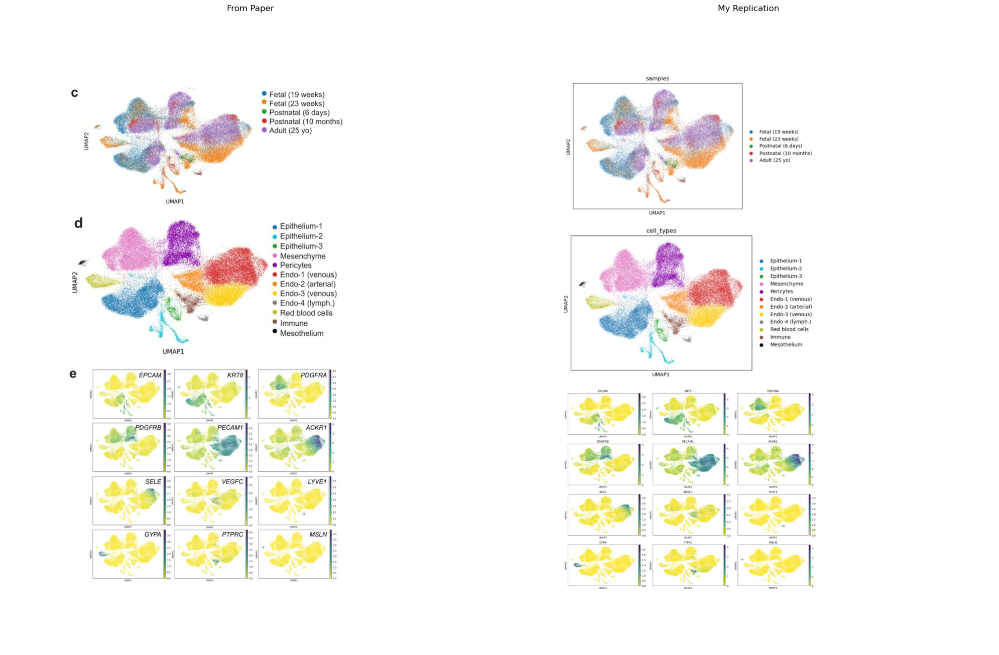

In [4]:
papervreplica('Fig1(c,d,e) Claim1.png','Fig1(c,d,e) Claim1 rep.png')

In [5]:
cmapo = plt.cm.get_cmap('viridis') 
reversecmap = cmapo.reversed()

C:\Users\khapr\AppData\Local\Temp\ipykernel_21564\2275036141.py:1: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmapo = plt.cm.get_cmap('viridis')


In [6]:
def init_umap(adata, genesList, samples, celltypes):
    sc.pl.umap(adata, color=samples)
    sc.pl.umap(adata, color=celltypes)
    num_rows = int(len(genesList) / 3) + (len(genesList) % 3 > 0)  
    fig, axes = plt.subplots(num_rows, 3, figsize=(15, 12))
    axes = axes.flatten()
    for i, gene in enumerate(genesList):
        ax = axes[i]
        ax.set_title(f'UMAP with {gene} Expression')
        sc.pl.umap(adata, color=gene, ax=ax, show=False, cmap=reversecmap)
    plt.tight_layout()

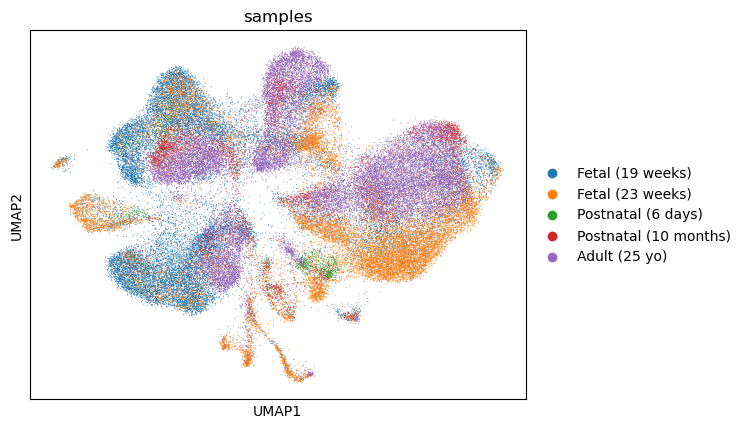

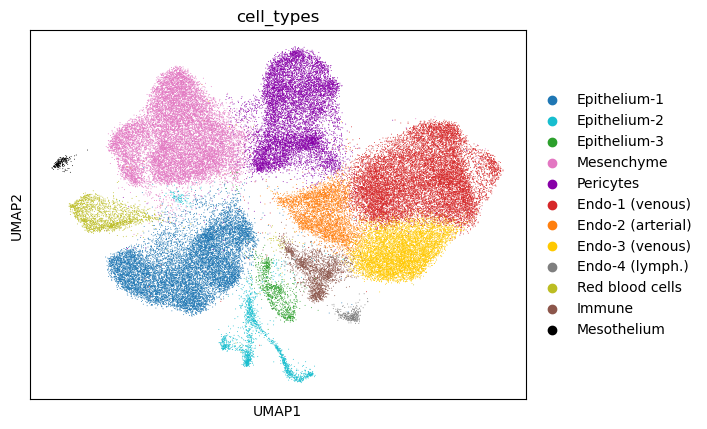

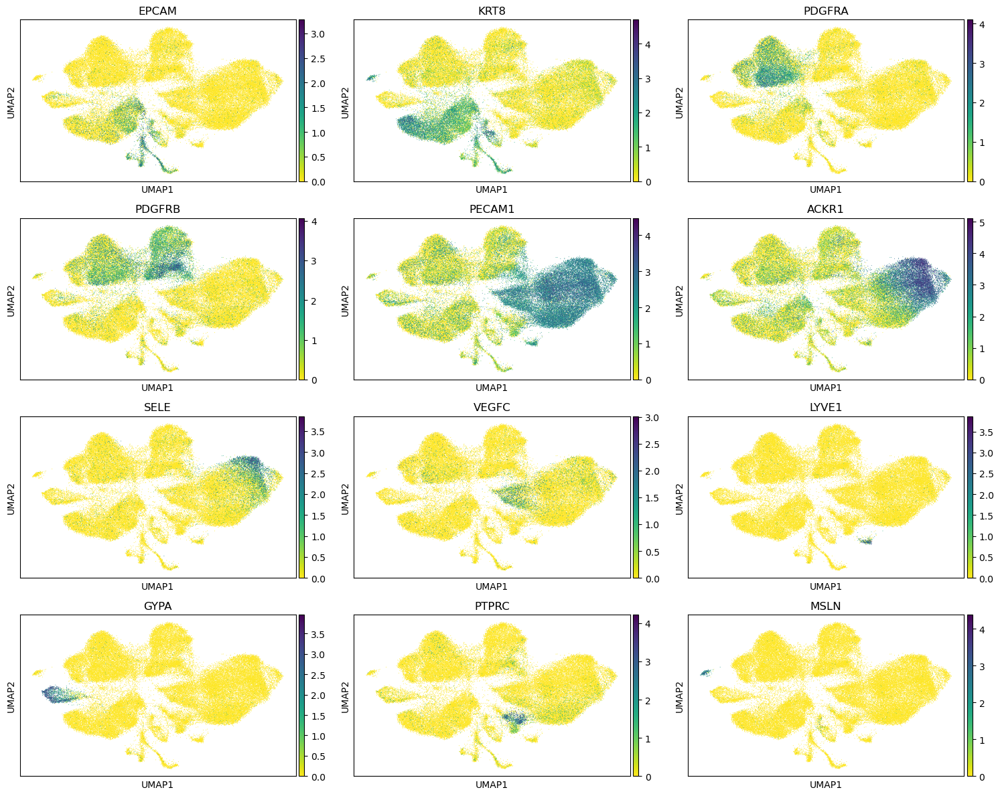

In [7]:
geneList = ['EPCAM', 'KRT8', 'PDGFRA', 'PDGFRB', 'PECAM1', 'ACKR1', 'SELE', 'VEGFC', 'LYVE1', 'GYPA', 'PTPRC', 'MSLN']
init_umap(allcells, geneList, 'samples', 'cell_types')

# Claim 2:  

#### Regulation of Thymic Epithelial Cell (TEC) Growth and Development by Interactions with Distinct Thymic Cell Types

### Subclaims

#### Figure 1F
- Mesenchymal cells, including ligands such as WNT5A, RSPO3, SFRP2, IGF1, and FGF10, play a crucial role in signaling for TEC growth.
- Receptors on epithelial cells, such as ROR1, ROR2, RYK, IGF1R, and FGFR2, respond to and mediate the effects of signaling molecules.

- Endothelial cells contribute to TEC development by expressing fibronectin (FN1), aiding in guiding the movement of various cells within the thymus.

#### Figure 1G
- Signaling molecules like BMP4, FGF7, and the WNT signaling inhibitor FRZB exhibit higher activity in postnatal and adult mesenchymal cells, suggesting a dynamic control mechanism at different life stages.

#### Figure 1F & 1I
- Pericytes play a crucial role in TEC differentiation, expressing the gene encoding the subunits of Activin A (INHBA) exclusively.


## Figure 1 Part F

### Paper vs Replication Image:

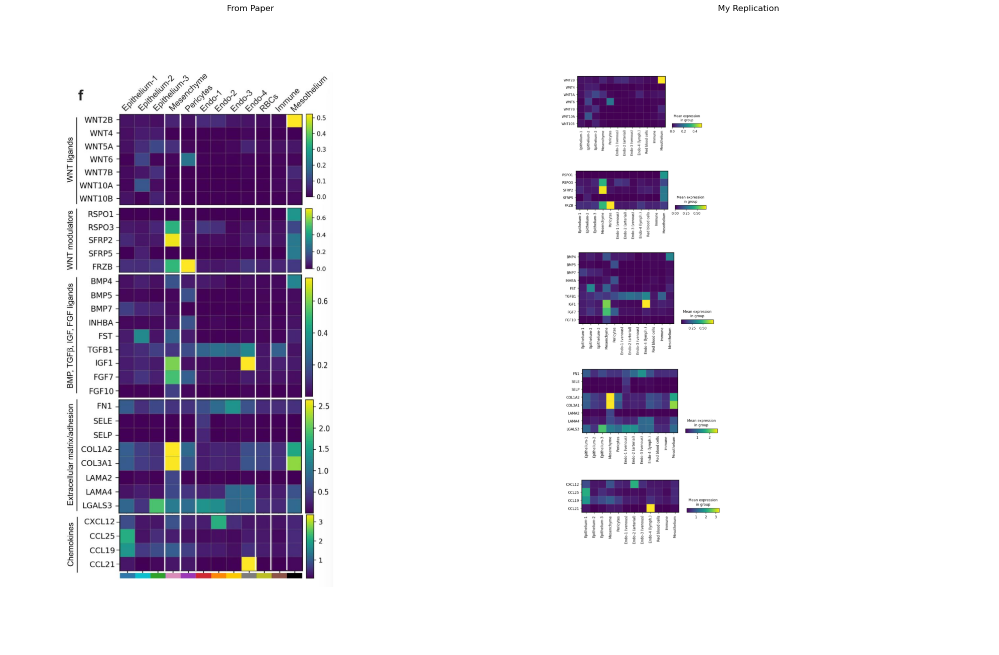

In [8]:
papervreplica('Fig1(f) Claim2.png','Fig1(f) Claim2 rep.png')

In [9]:
expressiondict = {'WNT ligands': ['WNT2B', 'WNT4', 'WNT5A', 'WNT6', 'WNT7B', 'WNT10A', 'WNT10B'],
                      'WNT Modulators': ['RSPO1', 'RSPO3', 'SFRP2', 'SFRP5', 'FRZB'],
                      'BMP, TGFbeta, IGF, FGF ligands':['BMP4', 'BMP5', 'BMP7', 'INHBA', 'FST', 'TGFB1', 'IGF1', 'FGF7', 'FGF10'],
                      'Extracellular matrix/adhesion': ['FN1', 'SELE', 'SELP', 'COL1A2', 'COL3A1', 'LAMA2', 'LAMA4', 'LGALS3'],
                      'Chemockines': ['CXCL12', 'CCL25', 'CCL19', 'CCL21']}

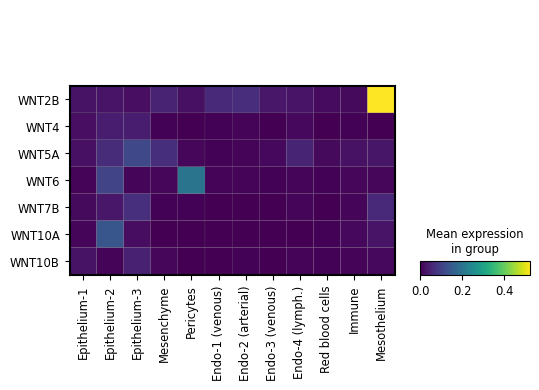

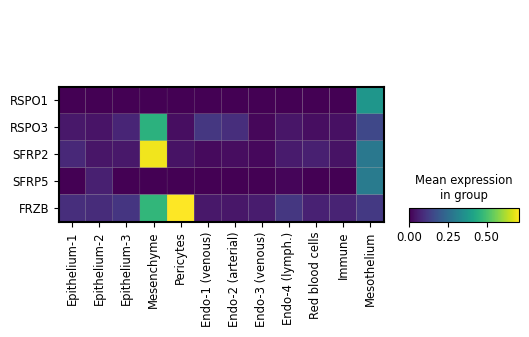

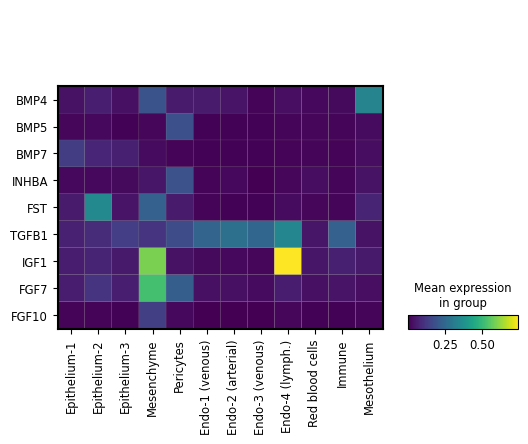

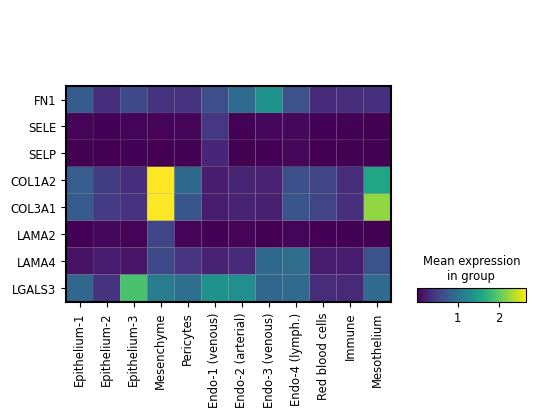

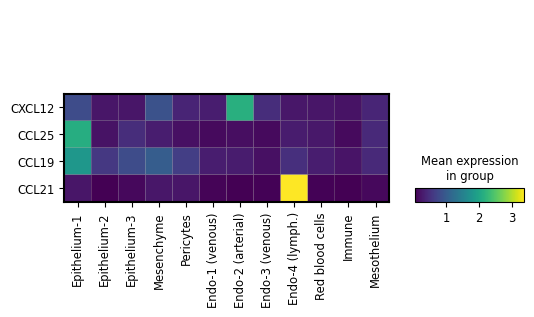

In [10]:
for k in expressiondict.keys():
    sc.pl.matrixplot(allcells,groupby="cell_types",var_names= expressiondict[k], swap_axes = True)

## Figure 1 Part G

### Paper vs Replication Image:

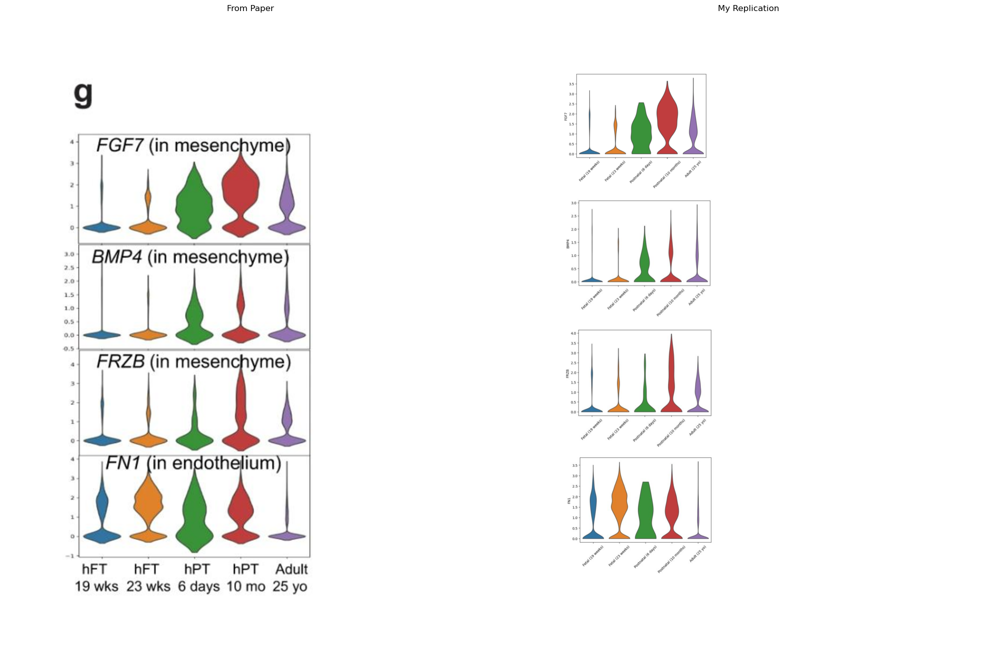

In [11]:
papervreplica('Fig1(g) Claim2.png','Fig1(g) Claim2 rep.png')

In [12]:
mesenchyme_cells = allcells[allcells.obs['cell_types'] == 'Mesenchyme']
endothelium_cells = allcells[allcells.obs['cell_types'].str.startswith('Endo')]
pericyte_cells = allcells[allcells.obs['cell_types'] == 'Pericytes']

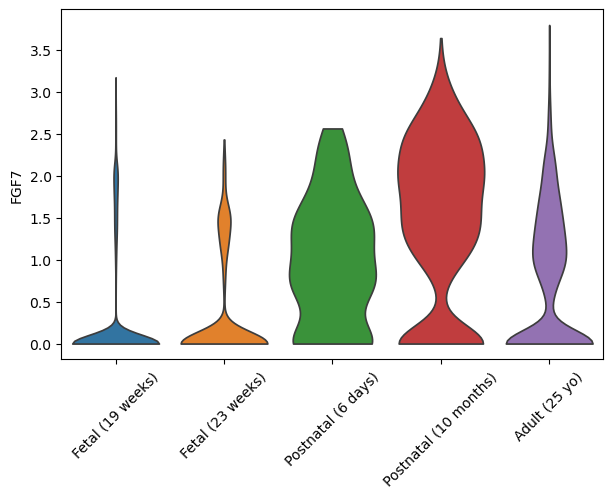

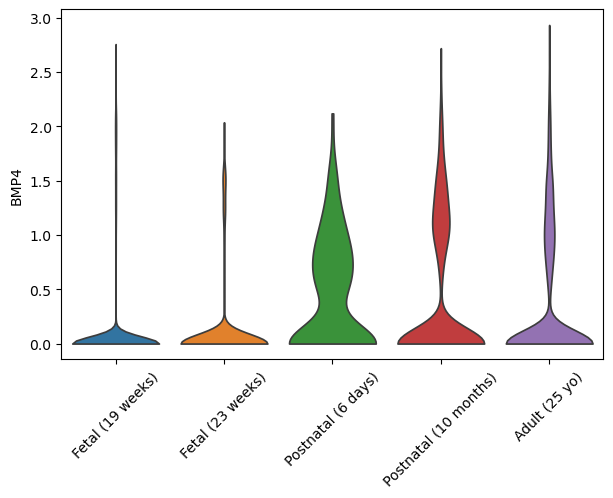

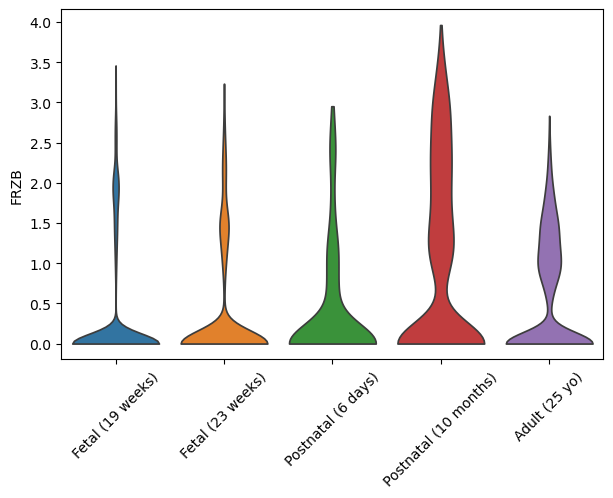

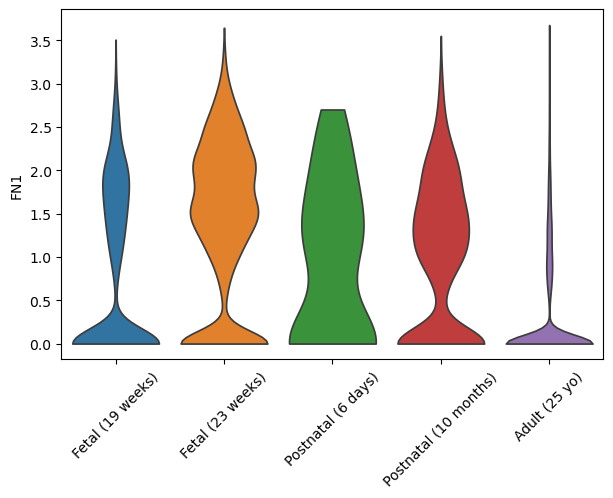

In [13]:
mesenchymelist = ['FGF7', 'BMP4', 'FRZB']
for m in mesenchymelist:
    sc.pl.violin(mesenchyme_cells, m, groupby='samples', jitter=0.4, stripplot = False, rotation = 45)
sc.pl.violin(endothelium_cells, 'FN1', groupby='samples', jitter=0.4, stripplot = False, rotation = 45)

## Figure 1 Part i

### Paper vs Replication Image:

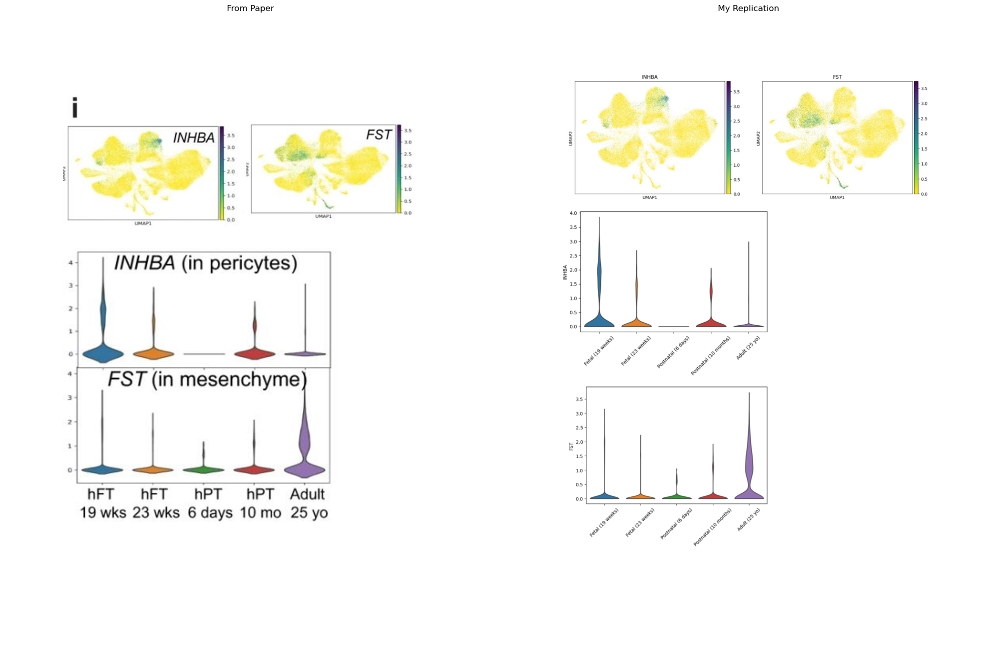

In [14]:
papervreplica('Fig1(i) Claim2.png','Fig1(i) Claim2 rep.png')

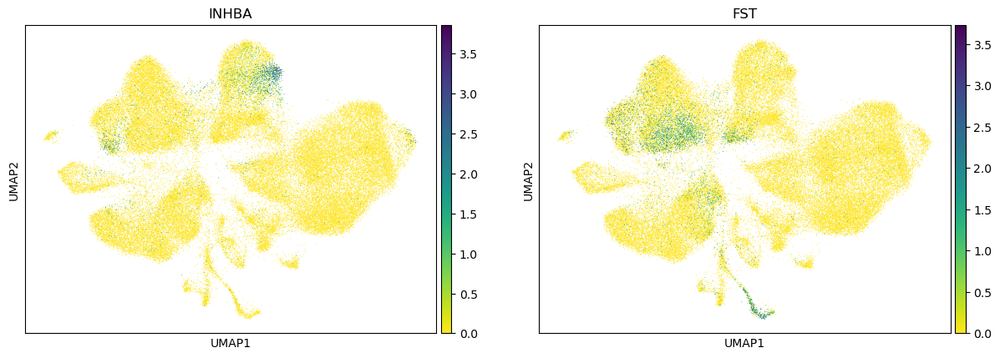

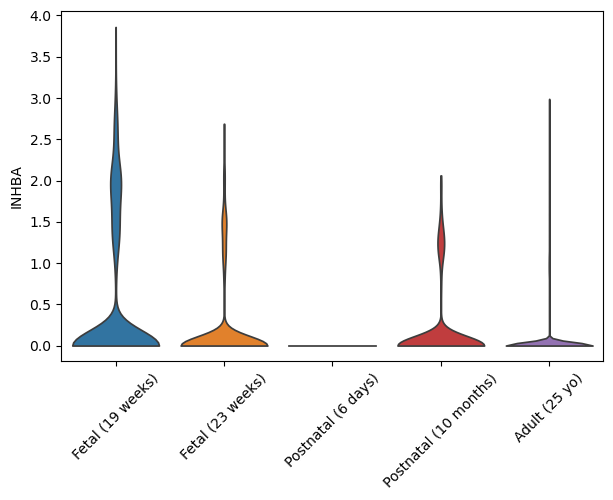

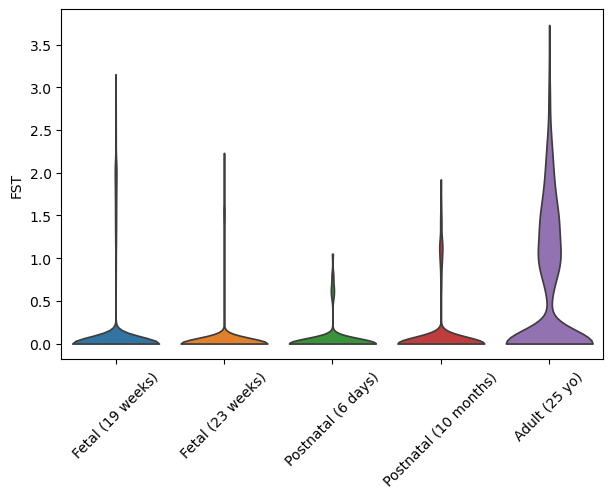

In [15]:
sc.pl.umap(allcells, color=['INHBA', 'FST'], cmap = reversecmap)
sc.pl.violin(pericyte_cells, 'INHBA', groupby='samples', jitter=0.4, stripplot = False, rotation = 45)
sc.pl.violin(mesenchyme_cells, 'FST', groupby='samples', jitter=0.4, stripplot = False, rotation = 45)

# Claim 3: 

#### Identification of 9 Unique Groups of Thymic Epithelial Cells (TECs) and Three New Cell Groups in accordance with Park et al. 

### Subclaims

#### Figure 2B
- The three main epithelial groups (Epithelium-1, -2, and -3) from Figure 1D were further divided into nine smaller groups.

#### Figure 2B-D
- Some groups exhibited gene characteristics of cortical thymic cells (cTECs), while others resembled medullary thymic cells (mTECs), with variations in their activity and specialization.
- Mature cells expressing TEC identity genes like FOXN1, PAX9, SIX1 were found in a cluster lacking functional gene characteristics of cTECs and mTECs.

#### Figure 2C-D & Supplementary Figure 2 B,D,E
- Three new cell groups, including neuroendocrine cells, myoid cells, and myelin+ epithelial cells, were identified through clustering and known markers.
- Park et al. reaffirmed the presence of all cell type clusters, introducing a new cell type called early cTEC from early fetal samples.

#### Figure 2E & Supplementary Figure 2G
- Immature TECs were observed in all age groups, with few cTECs or mTEChi in adult thymus, indicating a higher prevalence of immature TECs in adults that may impact functionality and immune response.
- Comparison with data from another study by Park et al. supported the consistency of these findings.

## Figure 2 Part A-C

### Paper vs Replication Image:

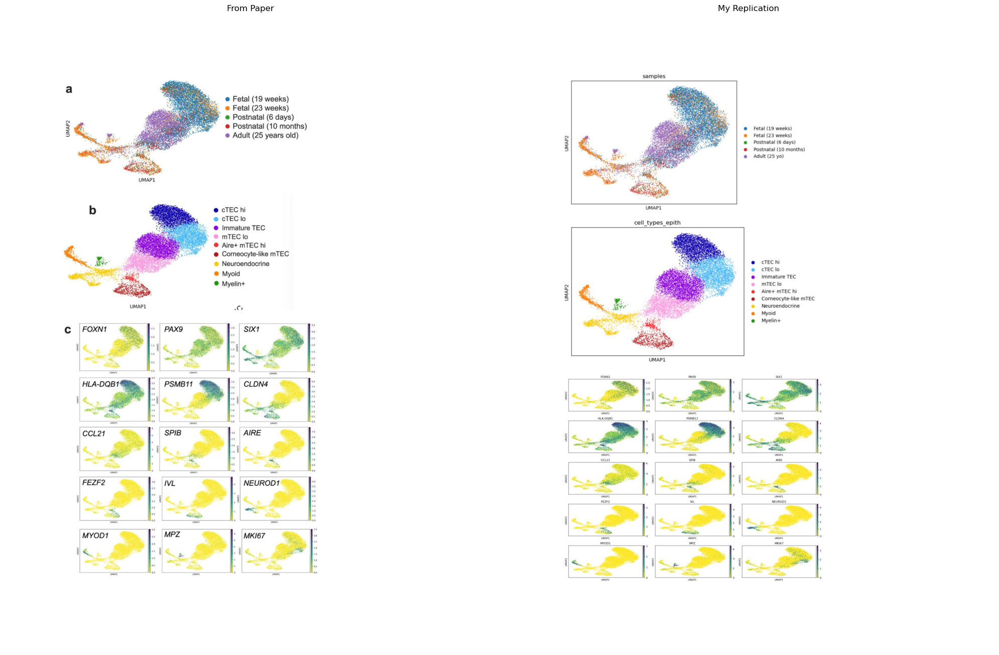

In [16]:
papervreplica('Fig2(a,b,c) Claim3.png','Fig2(a,b,c) Claim3 rep.png')

In [17]:
epithList = ['FOXN1', 'PAX9', 'SIX1', 'HLA-DQB1', 'PSMB11', 'CLDN4', 'CCL21', 'SPIB', 'AIRE', 'FEZF2', 'IVL', 'NEUROD1', 'MYOD1', 'MPZ', 'MKI67']

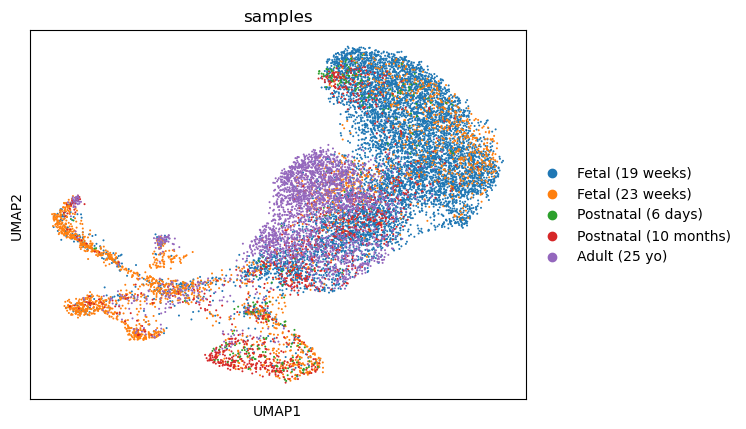

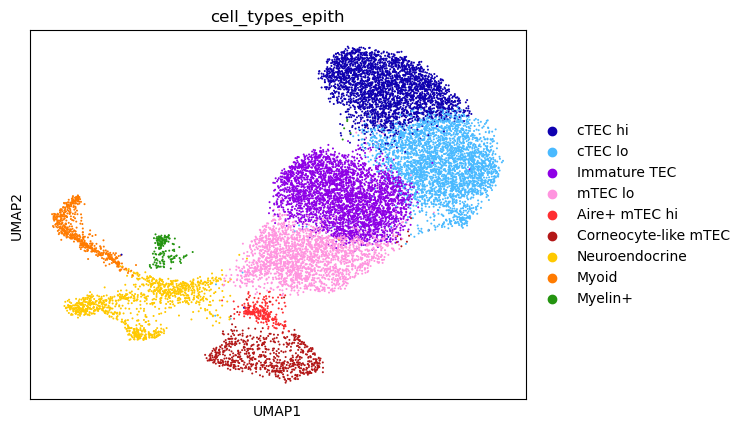

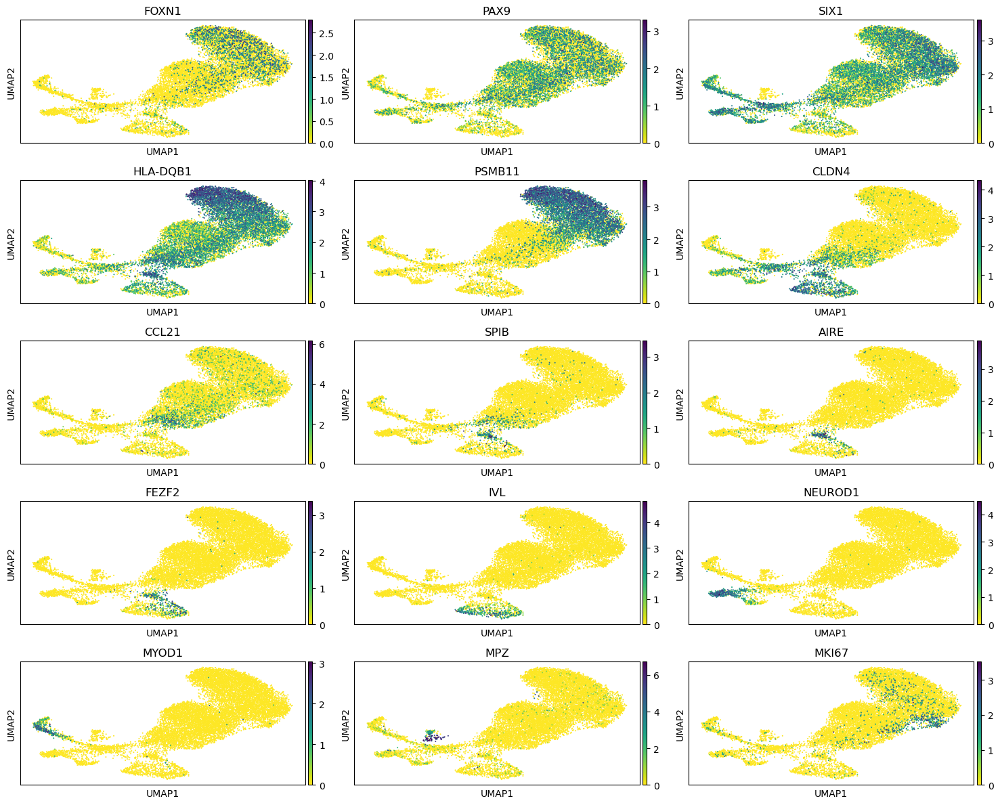

In [18]:
init_umap(epith, epithList, 'samples', 'cell_types_epith')

## Figure 2 Part D-E

### Paper vs Replication Image:

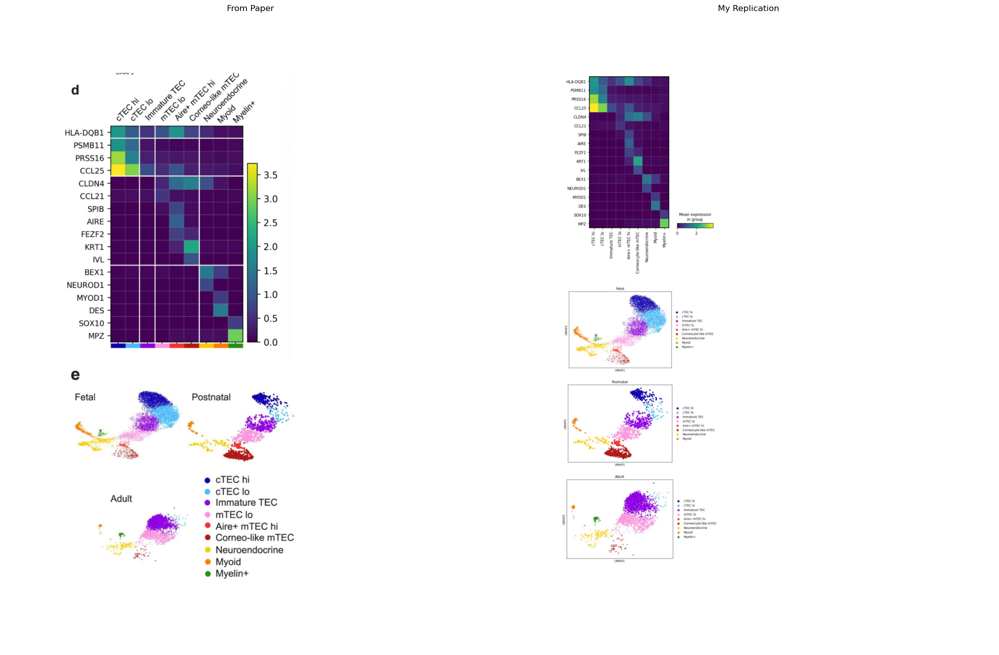

In [19]:
papervreplica('Fig2(d,e) Claim3.png','Fig2(d,e) Claim3 rep.png')

In [20]:
fetalepith = epith[epith.obs['samples'].str.startswith('Fetal')]
postnatalepith = epith[epith.obs['samples'].str.startswith('Postnatal')]
adultepith = epith[epith.obs['samples'].str.startswith('Adult')]

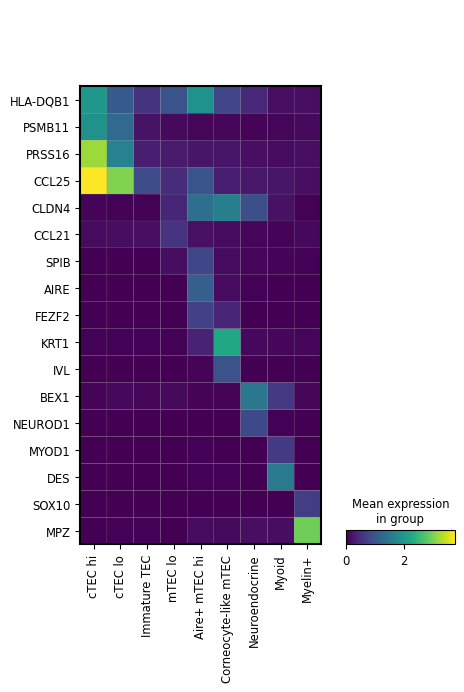

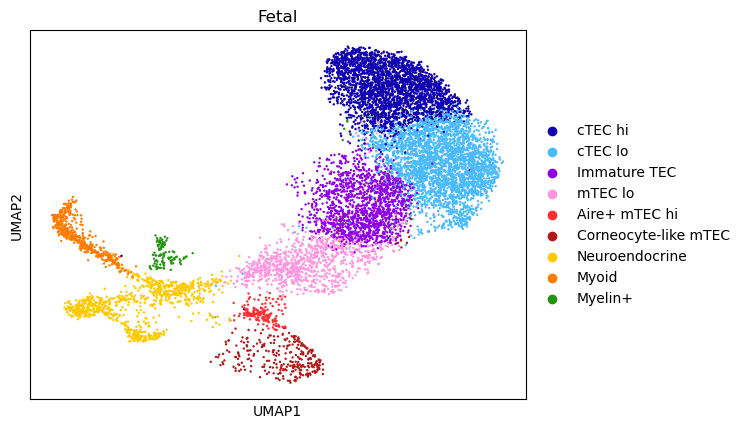

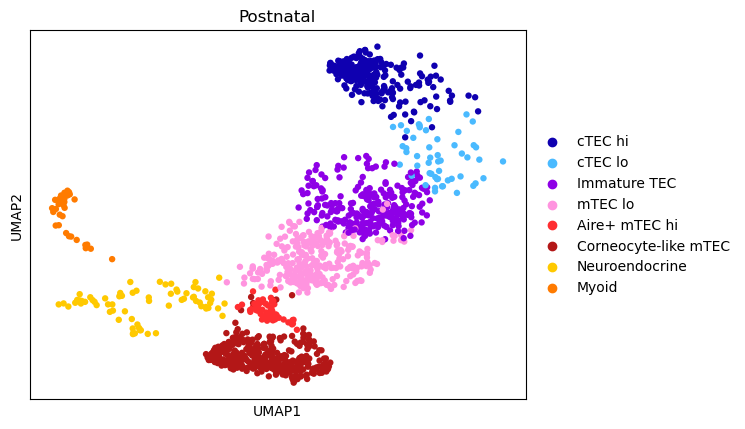

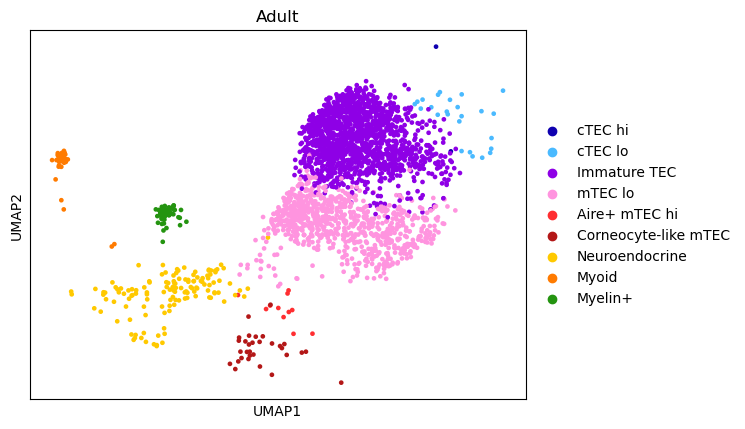

In [21]:
mtxepith = ['HLA-DQB1', 'PSMB11', 'PRSS16', 'CCL25', 'CLDN4', 'CCL21', 'SPIB', 'AIRE', 'FEZF2', 'KRT1', 'IVL', 'BEX1', 'NEUROD1', 
            'MYOD1', 'DES', 'SOX10', 'MPZ']
sc.pl.matrixplot(epith,groupby="cell_types_epith",var_names= mtxepith, swap_axes = True)
sc.pl.umap(fetalepith, color='cell_types_epith', title='Fetal')
sc.pl.umap(postnatalepith, color='cell_types_epith', title='Postnatal')
sc.pl.umap(adultepith, color='cell_types_epith', title='Adult')

## Supplementary Figure 2 Part B,D,E

### Paper vs Replication Image:

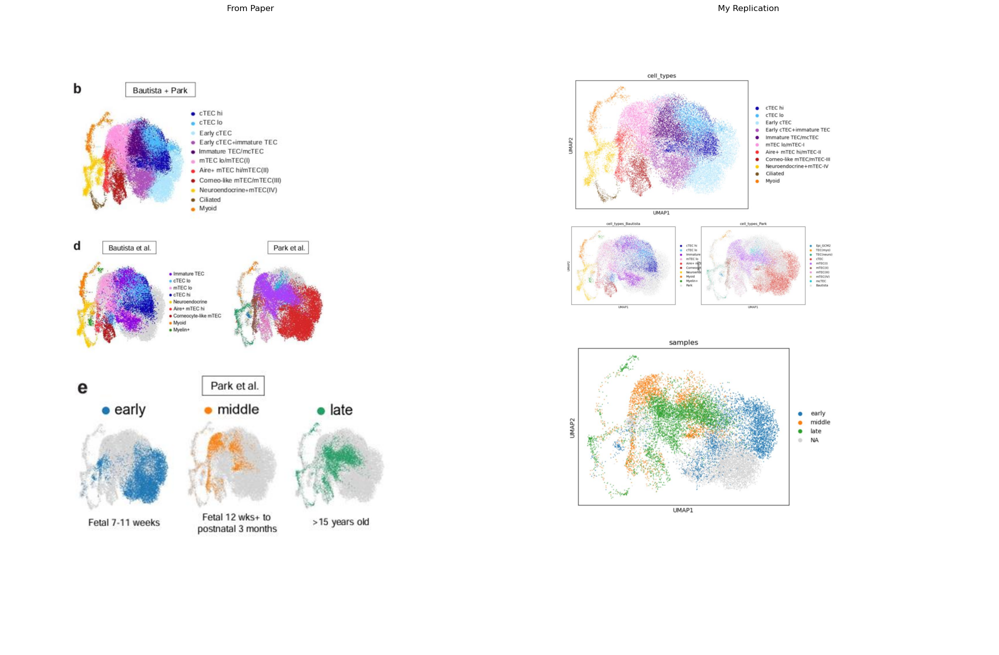

In [22]:
papervreplica('SuppFig2(b,d,e) Claim3.png','SuppFig2(b,d,e) Claim3 rep.png')

In [23]:
bautista1 = bautista[bautista.obs['cell_types_Bautista'] == 'Park']
conditions = [
    bautista1.obs['age'].isin(['8w', '9w', '10w', '11w']),
    bautista1.obs['age'].isin(['12w', '13w', '14w', '16w', '17w', '3m']),
    bautista1.obs['age'].isin(['19y', '35y'])
]
values = ['early', 'middle', 'late']
bautista1.obs['samples'] = np.select(conditions, values, default='Unknown')
bautista1.obs['samples'] = pd.Categorical(bautista1.obs['samples'], categories=values, ordered=True)
sc.tl.rank_genes_groups(bautista1, groupby="samples", method='t-test_overestim_var')

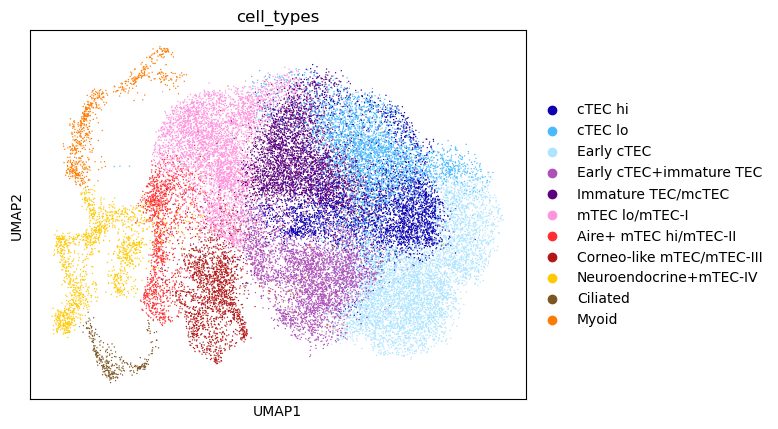

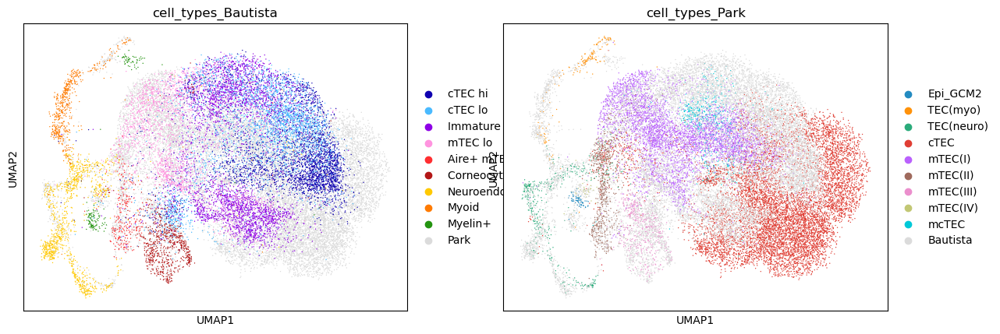

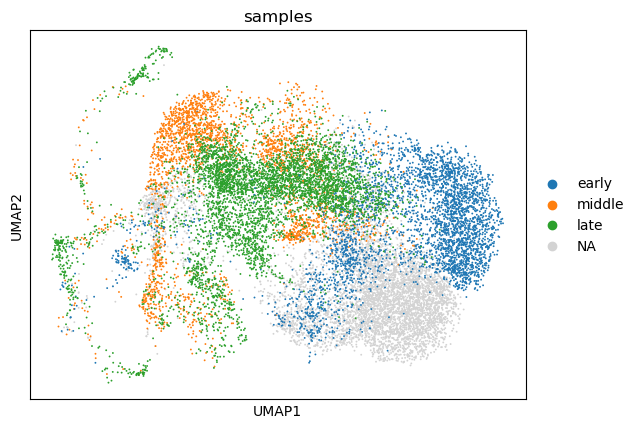

In [24]:
sc.pl.umap(bautista, color='cell_types') 
sc.pl.umap(bautista, color=['cell_types_Bautista','cell_types_Park']) 
sc.pl.umap(bautista1, color='samples') 

## Supplementary Figure 2 Part G

### Paper vs Replication Image:

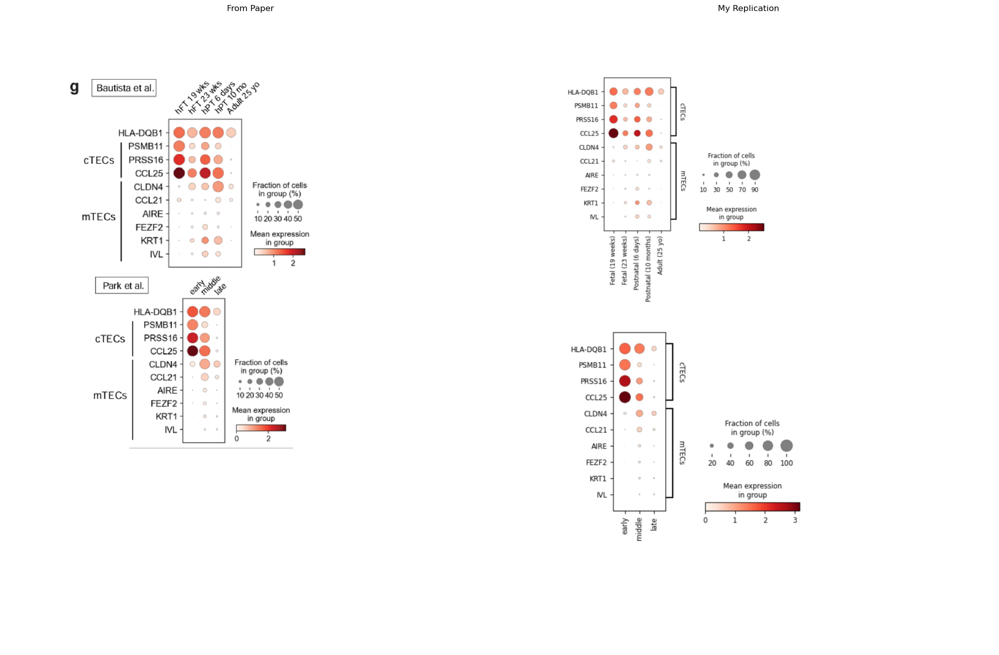

In [25]:
papervreplica('SuppFig2(g) Claim3.png','SuppFig2(g) Claim3 rep.png')

In [26]:
comb_tec = {'cTECs': ['HLA-DQB1', 'PSMB11', 'PRSS16', 'CCL25'],
                      'mTECs': ['CLDN4', 'CCL21', 'AIRE', 'FEZF2', 'KRT1', 'IVL']}
sc.tl.rank_genes_groups(epith, groupby="samples", method='t-test_overestim_var')

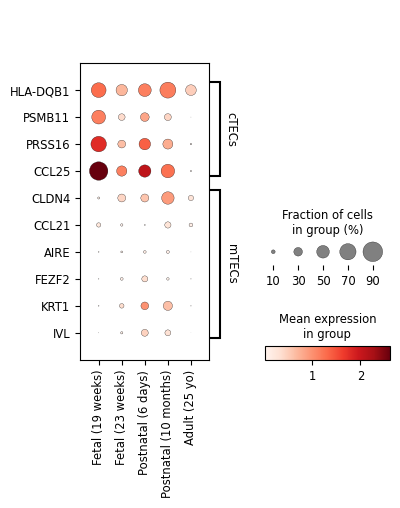

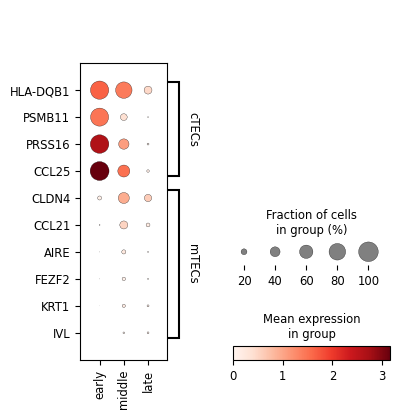

<Figure size 640x480 with 0 Axes>

In [27]:
fig = plt.figure(figsize=(4, 10))
ax1 = plt.subplot(2, 1, 1)
sc.pl.rank_genes_groups_dotplot(epith, key='rank_genes_groups', var_names=comb_tec, dendrogram=False, swap_axes=True, ax=ax1)
fig = plt.figure(figsize=(4, 10))
ax2 = plt.subplot(2, 1, 2)
sc.pl.rank_genes_groups_dotplot(bautista1, key='rank_genes_groups', var_names=comb_tec, dendrogram=False, swap_axes=True, ax=ax2)
plt.tight_layout()

# Claim 4

#### Analysis of Immature Thymic Epithelial Cells (TECs) Reveals Age-Dependent Expression Patterns and Implications for Thymic Function

### Subclaims

#### Figure 3A & B
- The cells within the immature TEC cluster were sub-clustered, revealing two distinct subpopulations named Immature TEC-1 and Immature TEC-2.

#### Figure 3C-D & Supplementary Figure 3A
- Different markers were identified in Immature TEC-1 and Immature TEC-2.
- Genes such as IGFBP5, NNMT, MAOA, DPYS, FKBP5, and GLUL, enriched in Immature TEC-2, exhibited higher expression in adult cells compared to fetal and postnatal tissues.
- The elevated expression of these genes in adult tissues was confirmed in the Park dataset, displaying variations between different age samples.

#### Figure 3E
- The cadherin gene CDH13, involved in cell-cell adhesion, was found to be expressed in immature TECs.

## Figure 3 Part A-C

### Paper vs Replication Image:

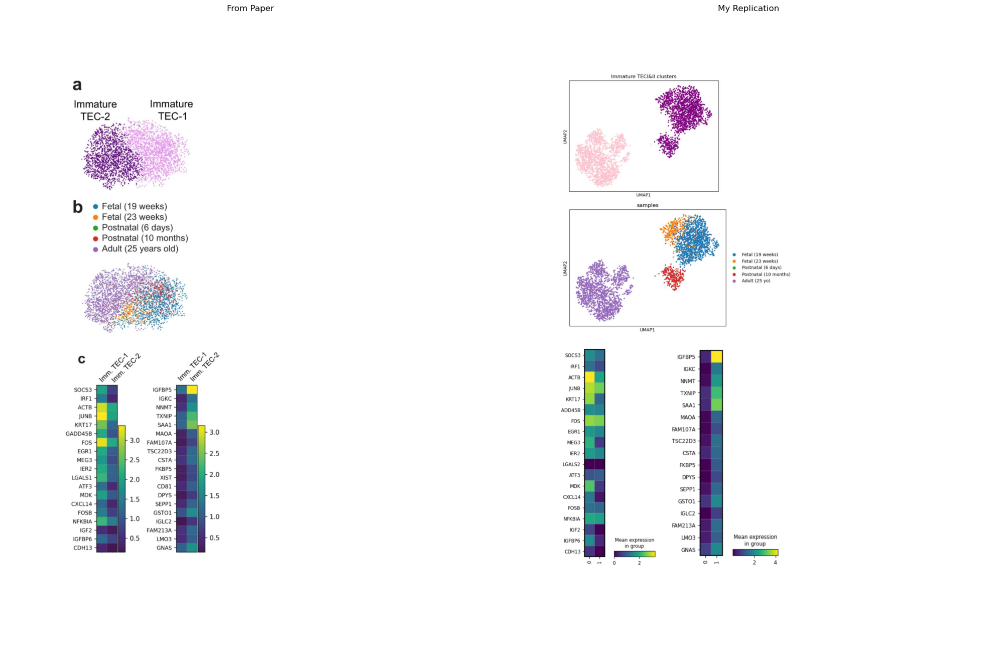

In [45]:
papervreplica('Fig3(a-c), Claim4.png','Fig3(a-c), Claim4 rep.png')

In [28]:
epithf = epith[epith.obs['cell_types_epith'] == 'Immature TEC']

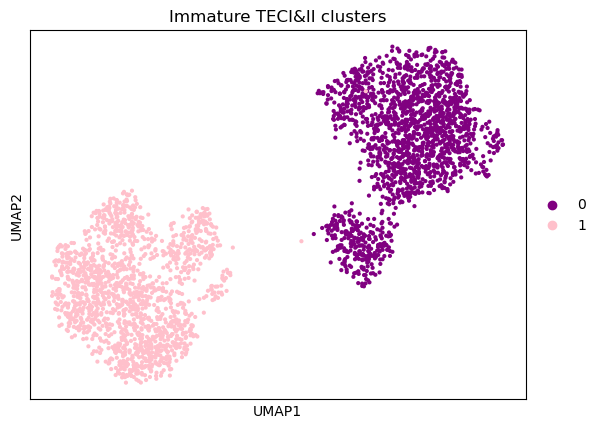

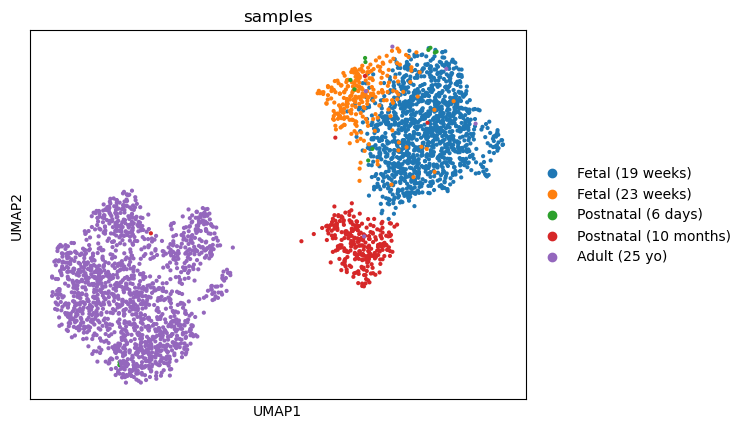

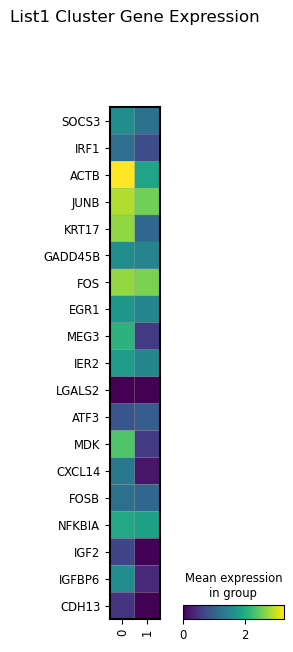

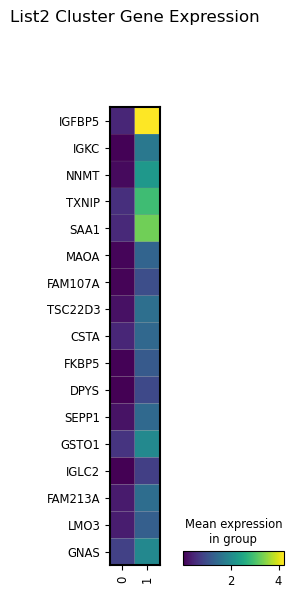

In [44]:
#umap
sc.pp.neighbors(epithf)
sc.tl.umap(epithf)
sc.tl.leiden(epithf, resolution = 0.1)
colors = sns.color_palette(['purple', 'pink'])
sc.pl.umap(epithf, color='leiden', title='Immature TECI&II clusters',palette=colors)
sc.pl.umap(epithf, color='samples') 

#cluster
leidenlist1 = ['SOCS3', 'IRF1', 'ACTB', 'JUNB', 'KRT17', 'GADD45B', 'FOS', 'EGR1', 'MEG3', 'IER2', 'LGALS2', 'ATF3', 'MDK', 'CXCL14', 'FOSB', 'NFKBIA', 'IGF2', 'IGFBP6', 'CDH13']
leidenlist2 = ['IGFBP5', 'IGKC', 'NNMT', 'TXNIP', 'SAA1', 'MAOA', 'FAM107A', 'TSC22D3', 'CSTA', 'FKBP5', 'DPYS', 'SEPP1', 'GSTO1', 'IGLC2', 'FAM213A', 'LMO3', 'GNAS']
sc.pl.matrixplot(epithf, var_names=leidenlist1, groupby='leiden', title='List1 Cluster Gene Expression', swap_axes=True)
sc.pl.matrixplot(epithf, var_names=leidenlist2, groupby='leiden', title='List2 Cluster Gene Expression', swap_axes=True)

## Figure 3 Part D-E & Supplementary Figure 3 Part A

### Paper vs Replication Image:

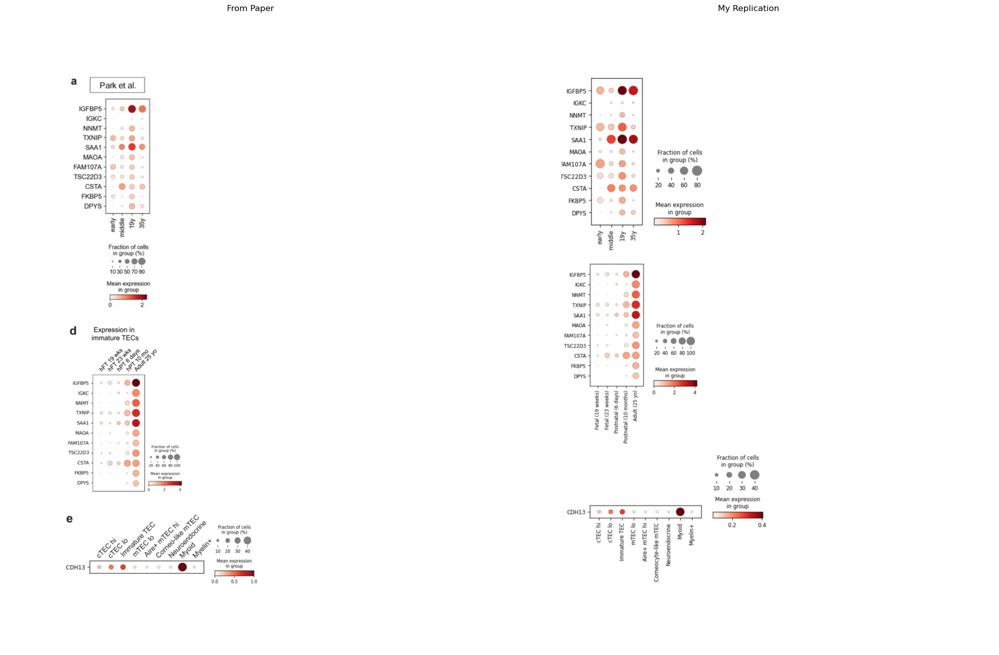

In [46]:
papervreplica('Fig3(d-e)&Supp3(a) Claim4.png','Fig3(d-e)&Supp3(a) Claim4 rep.png')

In [30]:
bautista2 = bautista[bautista.obs['cell_types_Bautista'] == 'Park']
conditions2 = [
    bautista2.obs['age'].isin(['8w', '9w', '10w', '11w']),
    bautista2.obs['age'].isin(['12w', '13w', '14w', '16w', '17w', '3m']),
    bautista2.obs['age'].isin(['19y']),
    bautista2.obs['age'].isin(['35y'])
]
values2 = ['early', 'middle', '19y', '35y']
bautista2.obs['samples'] = np.select(conditions2, values2, default='Unknown')
bautista2.obs['samples'] = pd.Categorical(bautista2.obs['samples'], categories=values2, ordered=True)
sc.tl.rank_genes_groups(bautista2, groupby="samples", method='t-test_overestim_var')

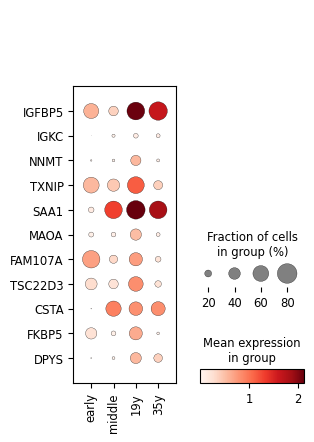

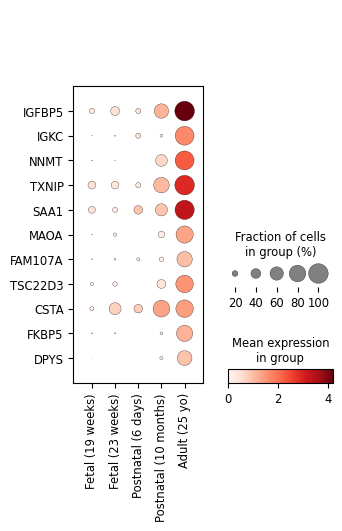

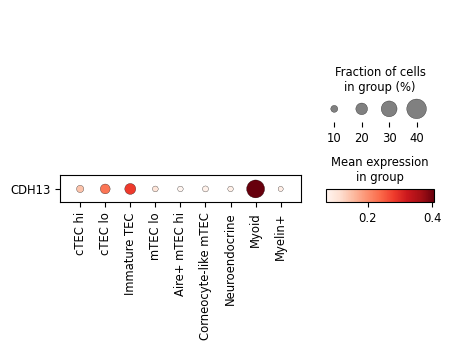

In [31]:
subset_genes = ['IGFBP5', 'IGKC', 'NNMT', 'TXNIP', 'SAA1', 'MAOA', 'FAM107A', 'TSC22D3', 'CSTA', 'FKBP5', 'DPYS']
sc.pl.dotplot(bautista2, groupby="samples", var_names=subset_genes, swap_axes = True)
sc.pl.dotplot(epithf, groupby="samples", var_names=subset_genes, swap_axes = True)
sc.pl.dotplot(epith, groupby="cell_types_epith", var_names='CDH13', swap_axes = True) 

# Claim 5

#### Notch Signaling and Other Pathways Influence Development of Distinct Medullary Thymic Epithelial Cell (mTEC) Subsets

### Subclaims

#### Figure 5B
- Notch target genes HES1 are enriched in mTEClo, while the Notch inhibitor HES6 is enriched in neuroendocrine/myoid clusters.
- Components of the Notch signaling pathway, including ligands, receptors, target genes, and inhibitors, exhibit higher expression in mTECs compared to cTECs.
- DLK1 in cTECs and DLK2 in immature TECs indicate reduced Notch signaling. Higher HES6 expression in neuroendocrine and myoid cells suggests active inhibition of Notch activity, implying a broader impact on epithelial cell fate beyond T cell specification.

#### Figure 5D
- TNF Receptors and Ligands, such as CD40 or LTBR, are known to control differentiation of mTECs. Other TNF receptors like OC40 and CD70 might also be involved.

#### Figure 5E-F
- Genes from the p53 and toll-like receptor pathways were upregulated in corneocyte-mTECs.
- Although the regulatory role of these pathways in mTEC differentiation remains uncertain, these findings provide insights into cell fate commitment in the epithelial compartment of the thymus, with potential implications for thymic function and differentiation of specific TEC subsets.

## Figure 5 Part B,D-F

### Paper vs Replication Image:

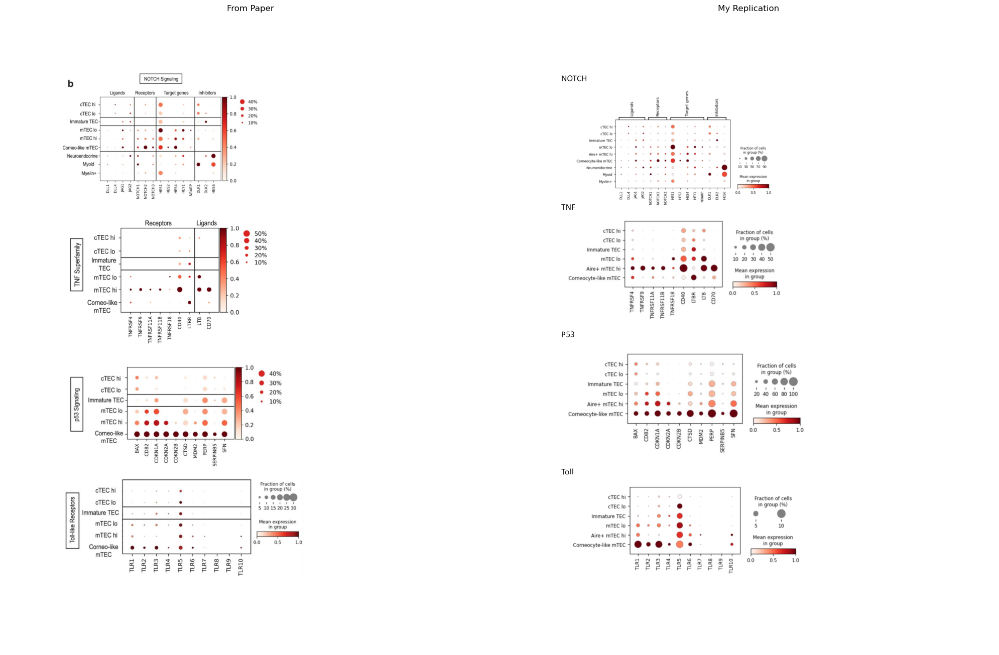

In [48]:
papervreplica('Fig5(b,d,f) Claim5.png','Fig5(b,d,f) Claim5 rep.png')

In [32]:
#notch
notch_sig = {'Ligands': ['DLL1', 'DLL4', 'JAG1', 'JAG2'],
                      'Receptors': ['NOTCH1', 'NOTCH2', 'NOTCH3'],
                      'Target genes':['HES1', 'HES2', 'HES4', 'HEY1', 'NRARP'],
                      'Inhibitors': ['DLK1', 'DLK2', 'HES6']}
sc.tl.rank_genes_groups(epith, groupby="cell_types_epith", method='t-test_overestim_var')

#p53
p53sig = ['BAX', 'CD82', 'CDKN1A', 'CDKN2A', 'CDKN2B', 'CTSD', 'MDM2', 'PERP', 'SERPINB5', 'SFN']
cell_typesexclude = ['Neuroendocrine', 'Myoid', 'Myelin+']
epith_filtered = epith[~epith.obs['cell_types_epith'].isin(cell_typesexclude)]

#tnfsuper
tnf_super = ['TNFRSF4', 'TNFRSF9', 'TNFRSF11A', 'TNFRSF11B', 'TNFRSF18', 'CD40', 'LTBR', 'LTB', 'CD70']

#toll-like
toll_like = ['TLR1', 'TLR2', 'TLR3', 'TLR4', 'TLR5', 'TLR6', 'TLR7', 'TLR8', 'TLR9', 'TLR10']

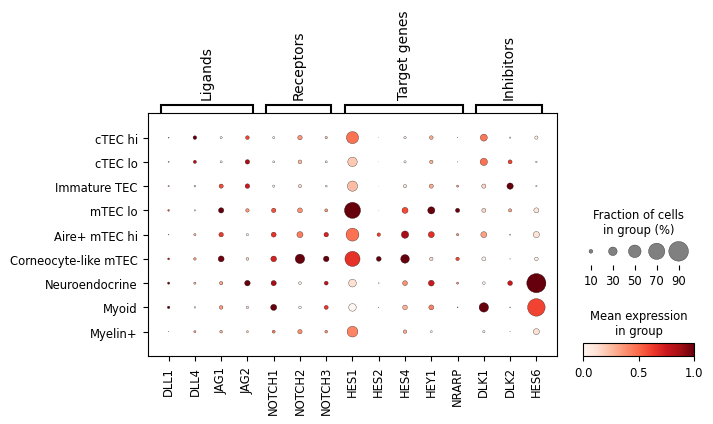

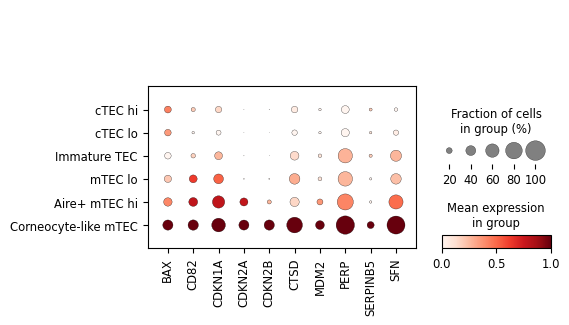

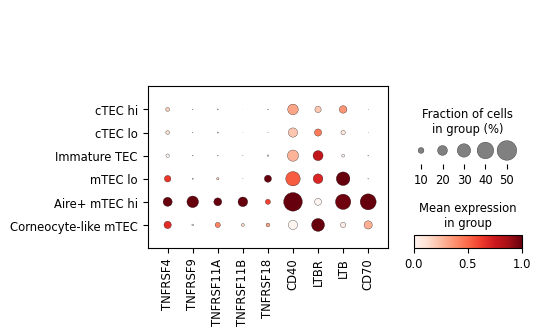

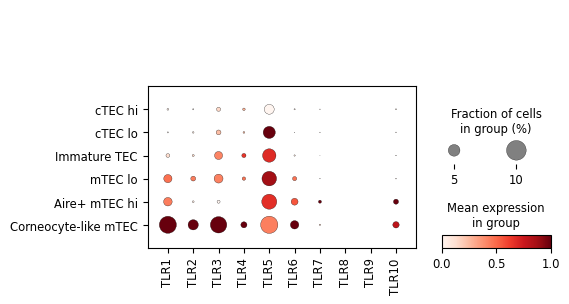

In [33]:
#notch
sc.pl.rank_genes_groups_dotplot(epith, key='rank_genes_groups', var_names=notch_sig,
    dendrogram=False, standard_scale='var')

#tnfsuper
sc.pl.rank_genes_groups_dotplot(epith_filtered, key='rank_genes_groups', var_names=tnf_super,
    dendrogram=False, standard_scale='var')

#p53
sc.pl.rank_genes_groups_dotplot(epith_filtered, key='rank_genes_groups', var_names=p53sig,
    dendrogram=False, standard_scale='var')

#toll_like 
sc.pl.rank_genes_groups_dotplot(epith_filtered, key='rank_genes_groups', var_names=toll_like,
    dendrogram=False, standard_scale='var')

# Discussion 

### Data Validity and Discrepancies

The main claims of the paper appear to be largely substantiated based on my analyses, reinforcing the credibility of the findings. The reproducibility of the results adds confidence to the study, as my independent analysis yielded similar outcomes across multiple claims, affirming the robustness of the reported findings. However, it is essential to acknowledge certain nuances and caveats in the results.

While claims one to three were validated successfully in my analysis, a discrepancy arose in main claim 2 (represented by claim 4 in my notebook) where my two unique subclusters for immature TEC1 and TEC2 differed from the paper. However, it intrigued me that, despite this discrepancy, further analyses with clustered data showed consistency with the results of the paper. This includes the expression of marker genes across timepoints in dotplots and matrix plots. The absence of specific insights for clustering and filtering of immature TECs in the methods section of the paper is a point of consideration and concern in the findings.

In the case of main claim 3 (represented as claim 5 in my notebook), the inability to validate the velocity graph due to compatibility issues with velocyto on Windows64 introduces a limitation. This underscores the importance of platform considerations in scRNA analysis and emphasizes the need for alternative tools or platforms for comprehensive analysis.

Noteworthy discrepancies were also observed in the representation of certain signaling pathways, such as Notch Signaling, p53, and Toll-like. The fraction of cells displayed in dotplots within the paper did not align precisely with my results even though the relative expressions appeared to be accurate. This raises questions about the completeness of the data. Additionally, TNF family genes showed a dotplot that is accurate with the one of the paper. This makes me question whether they included the Park et al. dataset within the Notch, p53, and Toll-like signaling pathways or whether they further filtered the data but have not indicated it within the text or methods. More likely, I hope to analyze what I have missed and where I might have made a mistake in preprocessing of the data.

Despite these discrepancies, the overall accuracy of the visualizations and the consistency with results from Park et al. data provide reassurance regarding the validity of the majority of findings.

### Research Impact

The impact of the study’s results lies in its comprehensive scRNA analysis of human thymic stromal cells, particularly focusing on the epithelial compartment. This contributes significantly to the field by extending beyond mouse TECs and immune cell populations.

The study underscores the crucial role of non-epithelial stromal cells in TEC development, emphasizing the significance of postnatal mesenchymal cells in regulating key processes. The identification of pericytes as the main source of activin A and myoid cells expressing follistatin highlights the complex interplay of stromal populations in TEC maturation, providing avenues for further exploration. Moreover, immature TEC is often present in older populations, this provides more insight into target points that determine the effectiveness and functionality of the thymus in aging populations. Signaling pathways, such as the proposed role of Notch signaling in thymic epithelial subset development aligns with known mechanisms in other stem cells, offering a mechanistic insight into TEC differentiation across time. This will help understand how to maintain thymic health and provide personalized clinical therapies for thymic-related disease.

Identification of novel subsets, such as ionocytes, ciliated, and Schwann cells bridges the gap between histological analyses and transcriptome information. The identification of CFTR+ ionocytes in the thymic medulla, not previously reported, is a major finding with potential implications for understanding thymus-related diseases such as autoimmune disease.

### Future Research

This study helps us comprehend human thymic development and its microenvironment across various life stages. The research's impact extends beyond its immediate scope, providing insight on nuanced processes of immune tolerance induction and their implications for autoimmune diseases and aging. As we navigate future research endeavors, a critical focus should be on validating signaling pathways, particularly those related to p53, Notch, and Toll-free pathways. Many differentiation outcomes in these pathways were hypothesized but not conclusively confirmed, warranting thorough investigation to bolster the reliability of these findings.

The mention of SOX2 in postnatal thymic dynamics, contrary to previous beliefs, adds a layer of complexity that merits further exploration. Understanding the role of SOX2 and its contributions to thymic processes will not only refine our understanding but also potentially challenge existing paradigms. Moreover, there is a pressing need to explore the mechanistic and cellular progression of epithelial cells into immature TECs within aging populations. Understanding and potentially limiting this progression could have profound implications for maintaining optimal immunity and thymic function in aging individuals.

The paper hints at novel insights into the expression patterns of genes, ligands, and receptors associated with thymic health. While these discoveries open new avenues, it is imperative for future research to validate and confirm these observations for practical clinical applications in autoimmune and aging studies. The translation of these findings from speculation to clinical relevance holds significant promise for advancing our ability to address health challenges associated with thymic dysfunction in diverse populations.


# Methods

## Data Accessibility

All data related to this study, including images, datasets, and code, can be accessed through the following link or GEO Accession Number: GSE147520: [https://www.ncbi.nlm.nih.gov/geo/query/acc.cgi?acc=GSE147520](https://www.ncbi.nlm.nih.gov/geo/query/acc.cgi?acc=GSE147520). Additionally, the files for the images and the Jupyter notebook containing the code will be provided along with the submission and made available on the GitHub repository: [https://github.com/ishakhapre/BIOS470Final](https://github.com/ishakhapre/BIOS470Final)

## Marker Utilization for UMAP Analyses (Fig. 1e, Claim 2 in Jupyter Notebook):

Known markers were employed to conduct Uniform Manifold Approximation and Projection (UMAP) analyses, as illustrated in Fig. 1e. This approach allowed for the visualization of cell distributions based on gene expression patterns.

## TEC Marker and Differentially Expressed Genes Analyses (Fig. 2c, d and Supplementary Data 2, Claim 3 in Jupyter Notebook)

Known thymic epithelial cell (TEC) markers, along with a list of differentially expressed genes, were utilized for the analyses presented in Fig. 2c, d, and Supplementary Data 2. This facilitated the characterization and understanding of TEC subpopulations.

## Subclustering of Immature TECs (Fig. 3, Claim 4 in Jupyter Notebook)

Subclustering of the Immature TECs in Fig. 3 was achieved using the Leiden algorithm with a resolution parameter set at 0.1. This approach allowed for a more detailed analysis of the heterogeneity within the Immature TEC cluster.

## Grouping and Ranking of Epithelial Cells

Epithelial cells were categorized by cell type, and the `rank_genes_groups` method was applied to rank genes within these cell types. This grouping and ranking methodology provided insights into the gene expression patterns within different epithelial cell populations. The same approach was applied to Park et al.'s data for consistency and comparative analysis.
